In [1]:
import numpy as np
import pandas as pd
import stlearn as st
import scanpy as sc
from anndata import AnnData
import copy

/home/mnik/miniconda3/envs/stlearn/lib/python3.8/site-packages/stlearn/tools/microenv/cci/het.py:192: NumbaDeprecationWarning: The keyword argument 'nopython=False' was supplied. From Numba 0.59.0 the default is being changed to True and use of 'nopython=False' will raise a warning as the argument will have no effect. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit(parallel=True, nopython=False)


In [2]:
data = sc.read('BCBA_data_plus_9_cell_types.h5')

In [3]:
data

AnnData object with n_obs × n_vars = 3798 × 22240
    obs: 'in_tissue', 'array_row', 'array_col', 'imagecol', 'imagerow', 'louvain', 'Cell_Type_1', 'Cell_Type_2', 'Cell_Type_3', 'Cell_Type_4', 'Cell_Type_5', 'Cell_Type_6', 'Cell_Type_7', 'Cell_Type_8', 'Cell_Type_9', 'spatial_domains'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mean', 'std'
    uns: 'log1p', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'spatial'
    obsm: 'X_pca', 'deconvolution', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [4]:
data.obs

,in_tissue,array_row,array_col,imagecol,imagerow,louvain,Cell_Type_1,Cell_Type_2,Cell_Type_3,Cell_Type_4,Cell_Type_5,Cell_Type_6,Cell_Type_7,Cell_Type_8,Cell_Type_9,spatial_domains
AAACAAGTATCTCCCA-1,1,50,102,1437.953781,1314.933980,0,0.000000,0.000000,0.000000,0.000000,0.604128,0.086992,0.182691,0.000000,0.126189,4
AAACACCAATAACTGC-1,1,59,19,502.640259,1489.603946,2,0.138796,0.000000,0.201821,0.175495,0.000000,0.237677,0.246211,0.000000,0.000000,0
AAACAGAGCGACTCCT-1,1,14,94,1349.092396,609.158410,3,0.000000,0.000000,0.063656,0.066810,0.390853,0.100649,0.112371,0.082064,0.183596,3
AAACAGGGTCTATATT-1,1,47,13,435.478544,1254.290416,0,0.000000,0.000000,0.000000,0.000000,0.843295,0.000000,0.156705,0.000000,0.000000,4
AAACAGTGTTCCTGGG-1,1,73,43,772.524745,1764.521435,2,0.105994,0.000000,0.175407,0.192714,0.000000,0.285919,0.239967,0.000000,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,1,31,77,1157.013190,941.996690,8,0.179680,0.081145,0.116692,0.178942,0.000000,0.109609,0.123210,0.091592,0.119131,0
TTGTTTCACATCCAGG-1,1,58,42,761.798672,1470.462032,2,0.061285,0.000000,0.102781,0.130404,0.000000,0.229400,0.236717,0.067780,0.171633,3
TTGTTTCATTAGTCTA-1,1,60,30,626.485142,1509.405926,2,0.112815,0.000000,0.252554,0.136298,0.000000,0.263559,0.234775,0.000000,0.000000,0
TTGTTTCCATACAACT-1,1,45,27,593.234318,1215.346522,0,0.000000,0.000000,0.000000,0.000000,0.289360,0.203918,0.195308,0.124506,0.186907,3


## Deconvolution visualisation

2024-11-26 12:26:23.687089: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-26 12:26:23.827312: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-11-26 12:26:23.827333: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2024-11-26 12:26:24.693326: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2024-

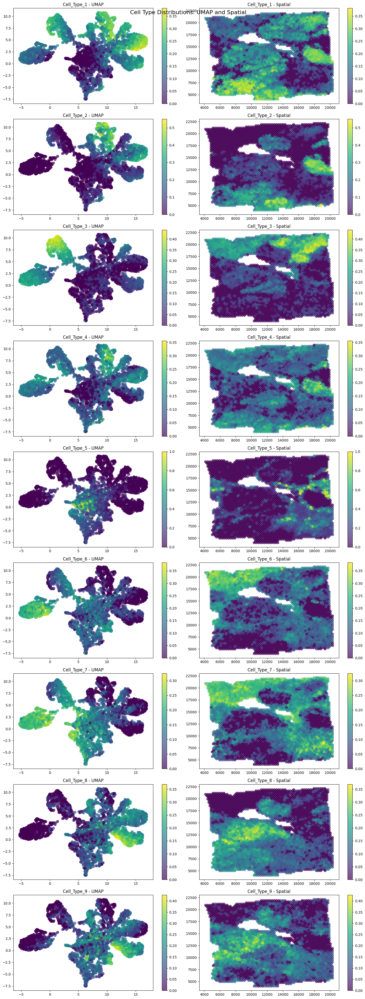

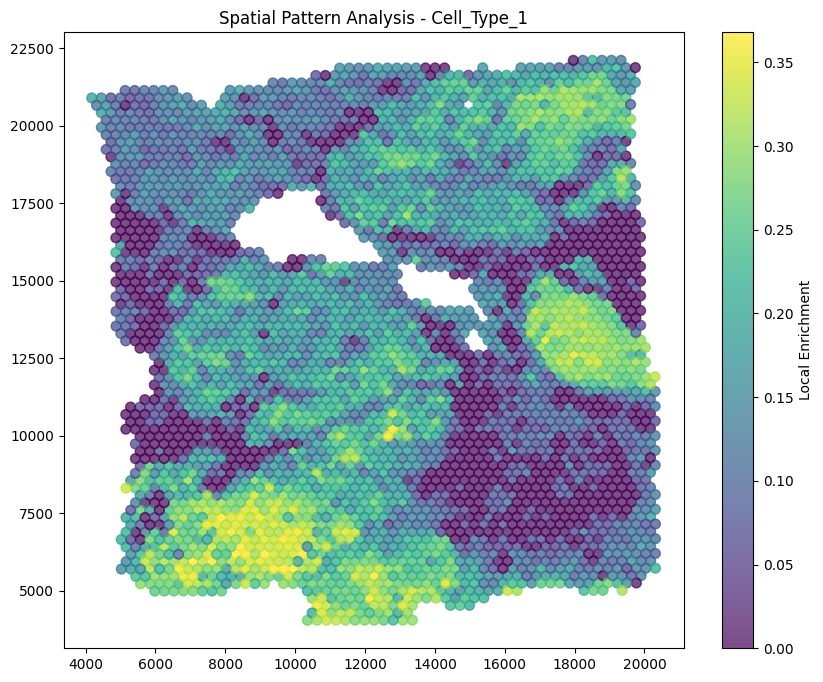

In [5]:
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
import seaborn as sns

def analyze_cell_types(adata, n_neighbors=15, min_dist=0.1):
    """
    Create UMAP and spatial plots for each cell type's proportions.
    
    Parameters:
    -----------
    adata : AnnData
        Input annotated data matrix
    n_neighbors : int
        Number of neighbors for UMAP
    min_dist : float
        Minimum distance for UMAP
    """
    # Get cell type columns
    cell_type_cols = [col for col in adata.obs.columns if col.startswith('Cell_Type_')]
    
    # Create UMAP embedding of the expression data if not already present
    if 'X_umap' not in adata.obsm:
        sc.pp.neighbors(adata, n_neighbors=n_neighbors)
        sc.tl.umap(adata)
    
    # Set up the plotting grid
    fig, axes = plt.subplots(9, 2, figsize=(15, 40))
    fig.suptitle('Cell Type Distributions: UMAP and Spatial', fontsize=16)
    
    for idx, cell_type in enumerate(cell_type_cols):
        # UMAP plot
        ax_umap = axes[idx, 0]
        scatter_umap = ax_umap.scatter(
            adata.obsm['X_umap'][:, 0],
            adata.obsm['X_umap'][:, 1],
            c=adata.obs[cell_type],
            cmap='viridis',
            s=50,
            alpha=0.7
        )
        ax_umap.set_title(f'{cell_type} - UMAP')
        plt.colorbar(scatter_umap, ax=ax_umap)
        
        # Spatial plot
        ax_spatial = axes[idx, 1]
        scatter_spatial = ax_spatial.scatter(
            adata.obsm['spatial'][:, 0],
            adata.obsm['spatial'][:, 1],
            c=adata.obs[cell_type],
            cmap='viridis',
            s=50,
            alpha=0.7
        )
        ax_spatial.set_title(f'{cell_type} - Spatial')
        plt.colorbar(scatter_spatial, ax=ax_spatial)
        
        # Compute KNN for this cell type
        proportions = adata.obs[cell_type].values.reshape(-1, 1)
        knn = NearestNeighbors(n_neighbors=n_neighbors)
        knn.fit(proportions)
        distances, indices = knn.kneighbors(proportions)
        
        # Store KNN results in adata
        adata.uns[f'{cell_type}_knn'] = {
            'indices': indices,
            'distances': distances
        }
    
    plt.tight_layout()
    return adata

# Function to analyze spatial patterns
def analyze_spatial_patterns(adata, cell_type):
    """
    Analyze spatial patterns for a specific cell type using KNN results
    
    Parameters:
    -----------
    adata : AnnData
        Input annotated data matrix
    cell_type : str
        Name of the cell type to analyze
    """
    knn_data = adata.uns[f'{cell_type}_knn']
    
    # Calculate local enrichment
    local_enrichment = np.mean(
        adata.obs[cell_type].values[knn_data['indices']], 
        axis=1
    )
    
    # Plot spatial distribution with local enrichment
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(
        adata.obsm['spatial'][:, 0],
        adata.obsm['spatial'][:, 1],
        c=local_enrichment,
        cmap='viridis',
        s=50,
        alpha=0.7
    )
    plt.colorbar(scatter, label='Local Enrichment')
    plt.title(f'Spatial Pattern Analysis - {cell_type}')
    plt.show()


data = analyze_cell_types(data)
analyze_spatial_patterns(data, 'Cell_Type_1')

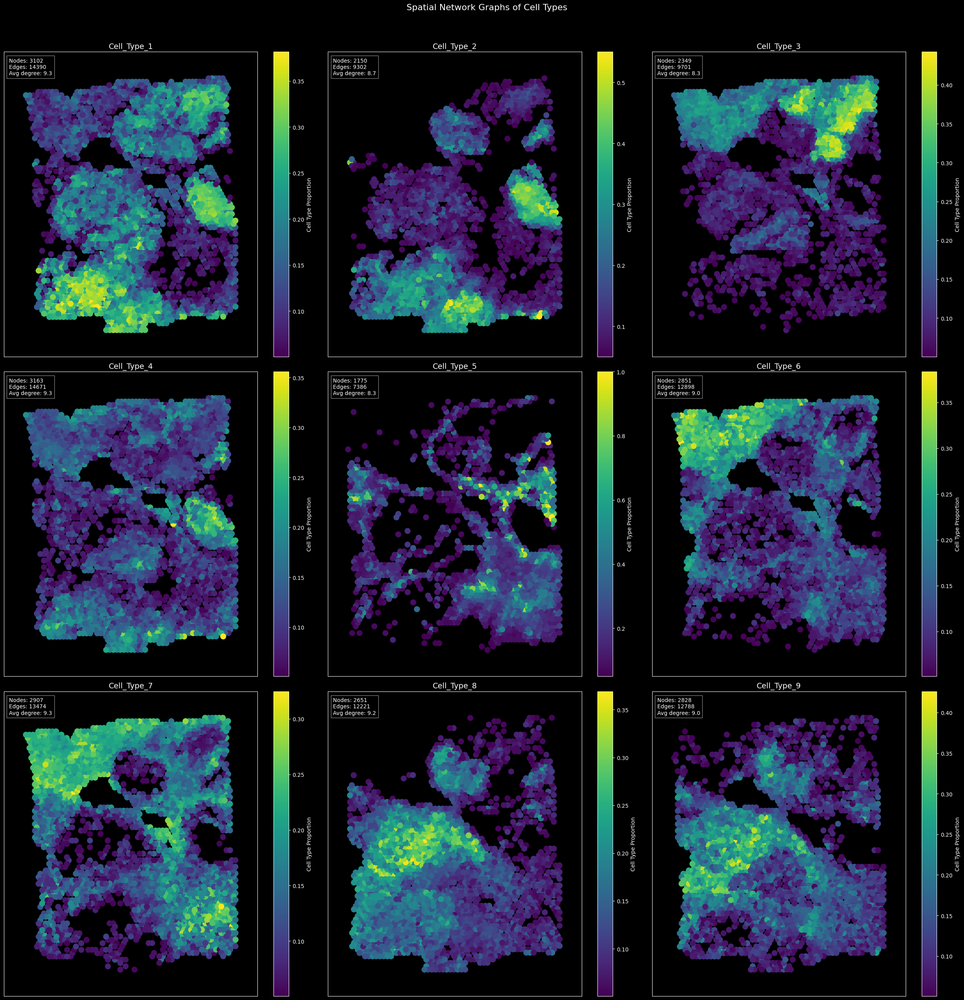


Detailed Network Analysis:

Cell_Type_1:
Number of nodes: 3102
Number of edges: 14390
Average degree: 9.28
Network density: 0.003
Average clustering coefficient: 0.450

Cell_Type_2:
Number of nodes: 2150
Number of edges: 9302
Average degree: 8.65
Network density: 0.004
Average clustering coefficient: 0.449

Cell_Type_3:
Number of nodes: 2349
Number of edges: 9701
Average degree: 8.26
Network density: 0.004
Average clustering coefficient: 0.455

Cell_Type_4:
Number of nodes: 3163
Number of edges: 14671
Average degree: 9.28
Network density: 0.003
Average clustering coefficient: 0.448

Cell_Type_5:
Number of nodes: 1775
Number of edges: 7386
Average degree: 8.32
Network density: 0.005
Average clustering coefficient: 0.461

Cell_Type_6:
Number of nodes: 2851
Number of edges: 12898
Average degree: 9.05
Network density: 0.003
Average clustering coefficient: 0.446

Cell_Type_7:
Number of nodes: 2907
Number of edges: 13474
Average degree: 9.27
Network density: 0.003
Average clustering coeffic

In [3]:
import networkx as nx
import numpy as np
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

def create_spatial_network(data, cell_type, n_neighbors=10, threshold=0.05):

    # Get spatial coordinates and cell type proportions
    coords = data.obsm['spatial']
    proportions = data.obs[cell_type].values
    
    # Create KNN graph based on spatial coordinates
    knn = NearestNeighbors(n_neighbors=n_neighbors)
    knn.fit(coords)
    distances, indices = knn.kneighbors()
    
    # Create network graph
    G = nx.Graph()
    
    for i in range(len(coords)):
        if proportions[i] > threshold:
            G.add_node(i, 
                      pos=(coords[i, 0], coords[i, 1]),
                      proportion=proportions[i])
            
            # Add edges to neighbors
            for j, dist in zip(indices[i], distances[i]):
                if proportions[j] > threshold:
                    # Edge weight based on both distance and proportion similarity
                    prop_similarity = 1 - abs(proportions[i] - proportions[j])
                    edge_weight = prop_similarity / (dist + 1e-6)  # Avoid division by zero
                    G.add_edge(i, j, weight=edge_weight)
    
    return G

# Create figure for all cell types
plt.style.use('dark_background')
fig, axes = plt.subplots(3, 3, figsize=(25, 25))
fig.suptitle('Spatial Network Graphs of Cell Types', fontsize=16, y=1.02)
axes_flat = axes.flatten()

# Get cell type columns
cell_type_cols = [col for col in data.obs.columns if col.startswith('Cell_Type_')]

# Create network plots for each cell type
for idx, cell_type in enumerate(cell_type_cols):
    ax = axes_flat[idx]
    
    # Create network
    G = create_spatial_network(data, cell_type)
    
    # Get node positions and proportions
    pos = nx.get_node_attributes(G, 'pos')
    proportions = nx.get_node_attributes(G, 'proportion')
    
    # Get edge weights for edge coloring
    edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
    
    edges = nx.draw_networkx_edges(G, pos,
                                 edge_color='lightblue',
                                 width=0.3,
                                 alpha=0.3,
                                 ax=ax)
    
    nodes = nx.draw_networkx_nodes(G, pos,
                                 node_color=list(proportions.values()),
                                 node_size=100,
                                 cmap='viridis',
                                 ax=ax)
    
    plt.colorbar(nodes, ax=ax, label='Cell Type Proportion')
    
    # Set title and remove axes
    ax.set_title(f'{cell_type}', fontsize=14, color='white')
    ax.set_facecolor('black')
    ax.set_xticks([])
    ax.set_yticks([])
    
    stats_text = (f"Nodes: {G.number_of_nodes()}\n"
                 f"Edges: {G.number_of_edges()}\n"
                 f"Avg degree: {sum(dict(G.degree()).values())/G.number_of_nodes():.1f}")
    ax.text(0.02, 0.98, stats_text,
            transform=ax.transAxes,
            color='white',
            fontsize=10,
            verticalalignment='top',
            bbox=dict(facecolor='black', alpha=0.5))

plt.tight_layout()
plt.show()

print("\nDetailed Network Analysis:")
for cell_type in cell_type_cols:
    G = create_spatial_network(data, cell_type)
    print(f"\n{cell_type}:")
    print(f"Number of nodes: {G.number_of_nodes()}")
    print(f"Number of edges: {G.number_of_edges()}")
    print(f"Average degree: {sum(dict(G.degree()).values())/G.number_of_nodes():.2f}")
    print(f"Network density: {nx.density(G):.3f}")
    if nx.is_connected(G):
        print(f"Average shortest path length: {nx.average_shortest_path_length(G):.2f}")
    print(f"Average clustering coefficient: {nx.average_clustering(G):.3f}")

## KNN per cell type

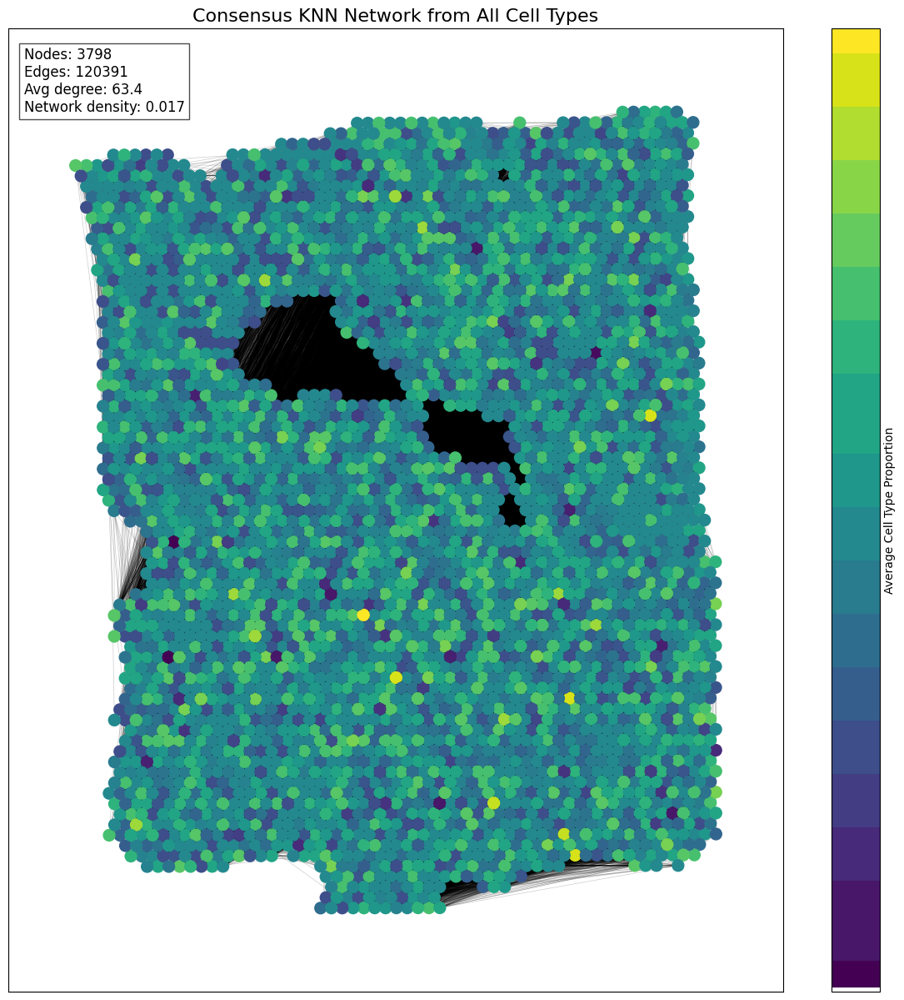


Consensus Network Analysis:
Number of nodes: 3798
Number of edges: 120391
Average degree: 63.40
Network density: 0.017
Average shortest path length: 4.00
Average clustering coefficient: 0.251


In [3]:
import networkx as nx
import numpy as np
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix, vstack
import pandas as pd

def create_cell_type_knn(data, cell_type, n_neighbors=10):
    """
    Create KNN graph for a single cell type
    """
    coords = data.obsm['spatial']
    proportions = data.obs[cell_type].values
    
    # Weight coordinates by cell type proportions
    weighted_coords = coords * proportions.reshape(-1, 1)
    
    # Create KNN graph
    knn = NearestNeighbors(n_neighbors=n_neighbors)
    knn.fit(weighted_coords)
    distances, indices = knn.kneighbors()
    
    # Create adjacency matrix
    n_cells = len(coords)
    adj_matrix = np.zeros((n_cells, n_cells))
    
    for i in range(n_cells):
        for j, dist in zip(indices[i], distances[i]):
            adj_matrix[i, j] = 1 / (dist + 1e-6)
    
    return csr_matrix(adj_matrix)

# Create individual KNNs for each cell type
cell_type_cols = [col for col in data.obs.columns if col.startswith('Cell_Type_')]
individual_knns = []
proportions_list = []

for cell_type in cell_type_cols:
    # Get KNN for this cell type
    knn_matrix = create_cell_type_knn(data, cell_type)
    individual_knns.append(knn_matrix)
    proportions_list.append(data.obs[cell_type].values)

# Convert proportions to matrix
proportions_matrix = np.column_stack(proportions_list)

# Create consensus KNN by weighted combination
consensus_knn = np.zeros(individual_knns[0].shape)
for i, knn in enumerate(individual_knns):
    weights = proportions_matrix[:, i]
    consensus_knn += knn.toarray() * weights.reshape(-1, 1)

# Normalize
consensus_knn = consensus_knn / len(cell_type_cols)

# Create network from consensus KNN
G_consensus = nx.from_numpy_array(consensus_knn)

# Add spatial positions to nodes
coords = data.obsm['spatial']
for i in range(len(coords)):
    G_consensus.nodes[i]['pos'] = tuple(coords[i])

# Visualize consensus network
plt.figure(figsize=(15, 15))
plt.title('Consensus KNN Network from All Cell Types', fontsize=16)

# Get node positions
pos = nx.get_node_attributes(G_consensus, 'pos')

# Calculate node colors based on average cell type proportion
avg_proportions = proportions_matrix.mean(axis=1)

# Draw network
edges = nx.draw_networkx_edges(G_consensus, pos,
                             alpha=0.2,
                             width=0.5)

nodes = nx.draw_networkx_nodes(G_consensus, pos,
                             node_color=avg_proportions,
                             node_size=100,
                             cmap='viridis')

plt.colorbar(nodes, label='Average Cell Type Proportion')

# Remove axes
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add network statistics
stats_text = (f"Nodes: {G_consensus.number_of_nodes()}\n"
             f"Edges: {G_consensus.number_of_edges()}\n"
             f"Avg degree: {sum(dict(G_consensus.degree()).values())/G_consensus.number_of_nodes():.1f}\n"
             f"Network density: {nx.density(G_consensus):.3f}")
plt.text(0.02, 0.98, stats_text,
         transform=plt.gca().transAxes,
         fontsize=12,
         verticalalignment='top',
         bbox=dict(facecolor='white', alpha=0.7))

plt.show()

# Print detailed network analysis
print("\nConsensus Network Analysis:")
print(f"Number of nodes: {G_consensus.number_of_nodes()}")
print(f"Number of edges: {G_consensus.number_of_edges()}")
print(f"Average degree: {sum(dict(G_consensus.degree()).values())/G_consensus.number_of_nodes():.2f}")
print(f"Network density: {nx.density(G_consensus):.3f}")
if nx.is_connected(G_consensus):
    print(f"Average shortest path length: {nx.average_shortest_path_length(G_consensus):.2f}")
print(f"Average clustering coefficient: {nx.average_clustering(G_consensus):.3f}")

In [7]:
import stlearn as st
import numpy as np
import scanpy as sc

st.em.run_pca(data,n_comps=50,random_state=0)
st.pp.tiling(data,out_path="tiling",crop_size = 40)
# First steps remain the same
# Extract features using Deep Learning
st.pp.extract_feature(data)

# Apply stSME spatial-PCA
st.spatial.morphology.adjust(data, use_data="X_pca", radius=50, method="mean")

PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Tiling image: 100%|████████████████████████████████████████████████████████████████████████████████ [ time left: 00:00 ]
2024-11-26 12:30:52.166362: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-11-26 12:30:52.167256: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory
2024-11-26 12:30:52.167569: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublasLt.so.11'; dlerror: libcublasLt.so.11: cannot open shared object file: No such file or directory
2024-11-26 12:30:52.167860: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcufft.so.10'; 

The morphology feature is added to adata.obsm['X_morphology']!


Adjusting data: 100%|██████████████████████████████████████████████████████████████████████████████ [ time left: 00:00 ]

The data adjusted by morphology is added to adata.obsm['X_pca_morphology']


In [8]:
conn_before = data.obsp['connectivities']

In [9]:
conn_before

<3798x3798 sparse matrix of type '<class 'numpy.float32'>'
	with 72020 stored elements in Compressed Sparse Row format>

## Consensus

Applying Louvain cluster ...
Louvain cluster is done! The labels are stored in adata.obs['louvain']


/home/mnik/miniconda3/envs/stlearn/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


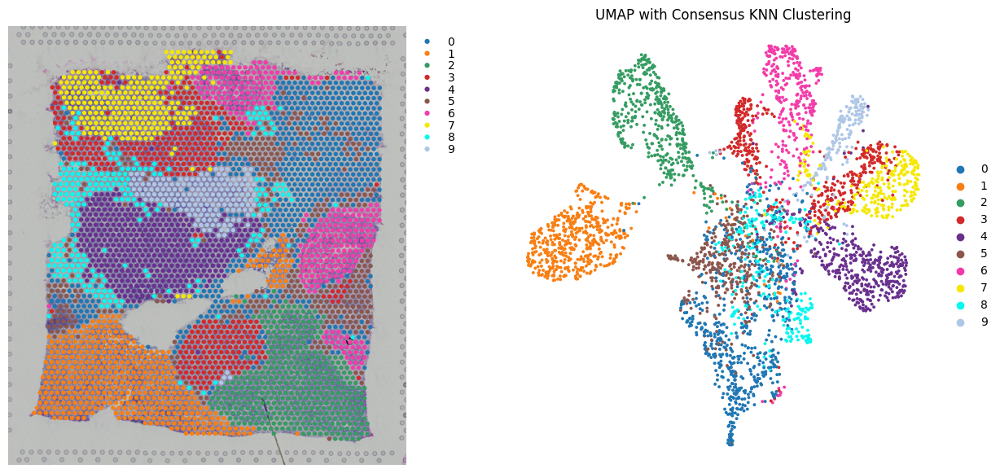

<Figure size 640x480 with 0 Axes>


Clustering Results:
Number of clusters: 10

Cluster sizes:
Cluster 0: 623 spots
Cluster 1: 503 spots
Cluster 2: 443 spots
Cluster 3: 425 spots
Cluster 4: 409 spots
Cluster 5: 353 spots
Cluster 6: 333 spots
Cluster 7: 277 spots
Cluster 8: 256 spots
Cluster 9: 176 spots


In [7]:
from scipy.sparse import csr_matrix
from sklearn.preprocessing import StandardScaler

def improved_consensus_knn(adata, n_neighbors=25, alpha=0.5):
    cell_type_cols = [col for col in adata.obs.columns 
                      if col.startswith('Cell_Type_')]
    n_cells = len(adata)
    
    # Normalize morphology PCA coordinates
    morph_scaler = StandardScaler()
    normalized_morph_coords = morph_scaler.fit_transform(adata.obsm['X_pca_morphology'])
    
    # Normalize cell type proportions
    prop_scaler = StandardScaler()
    normalized_proportions = prop_scaler.fit_transform(adata.obs[cell_type_cols].values)
    
    # Morphology KNN with normalized coordinates
    morph_knn = NearestNeighbors(n_neighbors=n_neighbors, metric='euclidean')
    morph_knn.fit(normalized_morph_coords)
    morph_dist, morph_idx = morph_knn.kneighbors(normalized_morph_coords)
    
    # Proportion KNN with normalized proportions
    prop_knn = NearestNeighbors(n_neighbors=n_neighbors, metric='euclidean')
    prop_knn.fit(normalized_proportions)
    prop_dist, prop_idx = prop_knn.kneighbors(normalized_proportions)
    
    def gaussian_kernel(x, sigma=10):
        """
        Computes the Gaussian kernel values for the input array x with standard deviation sigma.
        
        Parameters:
        x (np.ndarray): Input array.
        sigma (float): Standard deviation of the Gaussian distribution.
        
        Returns:
        np.ndarray: Gaussian kernel values.
        """
        return np.exp(- (x ** 2) / (2 * sigma ** 2))
    
    morph_adj = np.zeros((n_cells, n_cells))
    prop_adj = np.zeros((n_cells, n_cells))

    # Morphology adjacency
    for i in range(n_cells):
        kernel_weights = gaussian_kernel(morph_dist[i])
        morph_adj[i, morph_idx[i]] = kernel_weights

    # Proportion adjacency
    for i in range(n_cells):
        kernel_weights = gaussian_kernel(prop_dist[i])
        prop_adj[i, prop_idx[i]] = kernel_weights

    # Normalize adjacency matrices
    morph_adj /= np.max(morph_adj)
    prop_adj /= np.max(prop_adj)

    # Consensus KNN
    consensus_knn = alpha * morph_adj + (1 - alpha) * prop_adj
    
    # Symmetrize
    consensus_knn = 0.5 * (consensus_knn + consensus_knn.T)
    
    # Store in AnnData object
    adata.obsp['distances'] = csr_matrix(1 - consensus_knn)  # Inverse for distance
    adata.obsp['connectivities'] = csr_matrix(consensus_knn)
    
    return adata

# Apply consensus KNN integration
# Higher alpha means increased dependency on morphology than proportions
data = improved_consensus_knn(data, n_neighbors=25, alpha=0.5)

# Proceed to clustering
st.tl.clustering.louvain(data, random_state=0, resolution=1.1)

# Create UMAP embedding if not already present
if 'X_umap' not in data.obsm:
    sc.tl.umap(data)

# Visualize results
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

# Plot spatial clusters with the correct use_label parameter
st.pl.cluster_plot(data, 
                  ax=ax1, 
                  size=15,
                  use_label="louvain",
                  title='Spatial Clusters with Consensus KNN',
                  show_image=True,
                  show_color_bar=True)

# Plot UMAP
sc.pl.umap(data, 
           color='louvain', 
           ax=ax2, 
           title='UMAP with Consensus KNN Clustering',
           frameon=False)

plt.tight_layout()
plt.show()

# Print some clustering statistics
cluster_counts = data.obs['louvain'].value_counts()
print("\nClustering Results:")
print(f"Number of clusters: {len(cluster_counts)}")
print("\nCluster sizes:")
for cluster, count in cluster_counts.items():
    print(f"Cluster {cluster}: {count} spots")

In [8]:
data.obsp['connectivities']

<3798x3798 sparse matrix of type '<class 'numpy.float64'>'
	with 257640 stored elements in Compressed Sparse Row format>

In [21]:
data.raw = data

In [9]:
data.write_h5ad('deconv_stlearn_processed_data.h5ad',compression='gzip')

In [2]:
import stlearn as st
import scanpy as sc

data = sc.read_h5ad("deconv_stlearn_processed_data.h5ad")

/home/mnik/miniconda3/envs/stlearn/lib/python3.8/site-packages/stlearn/tools/microenv/cci/het.py:192: NumbaDeprecationWarning: The keyword argument 'nopython=False' was supplied. From Numba 0.59.0 the default is being changed to True and use of 'nopython=False' will raise a warning as the argument will have no effect. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit(parallel=True, nopython=False)


In [4]:
data.uns["iroot"] = st.spatial.trajectory.set_root(data,use_label="louvain",cluster=5,use_raw=True) # run will cluster = 0 to 10
st.spatial.trajectory.pseudotime(data,eps=50,use_rep="X_pca",use_label="louvain")

All available trajectory paths are stored in adata.uns['available_paths'] with length < 4 nodes


Start to construct the trajectory: 5 -> 6


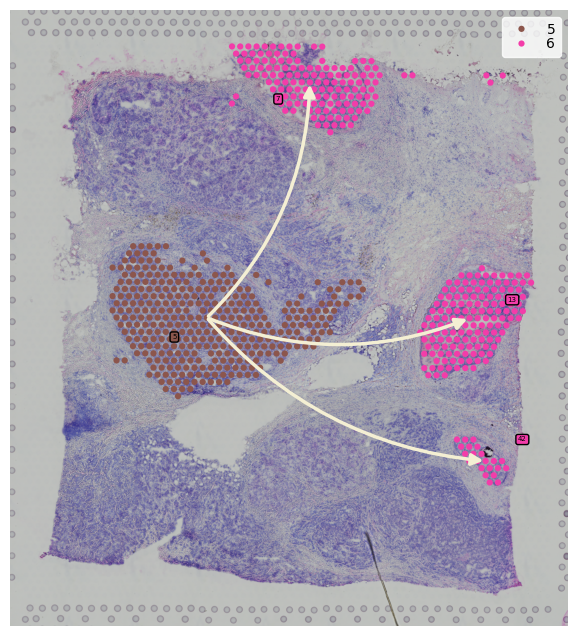

In [6]:
list_clusters = ["6", "5"]
st.spatial.trajectory.pseudotimespace_global(data,use_label="louvain",list_clusters=list_clusters)
st.pl.cluster_plot(data,use_label="louvain",show_trajectories=True,list_clusters=list_clusters,show_subcluster=True, figsize=(10,8), size=20)